In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

# **Imports and some global variables**

In [2]:
import torch
import torchvision
from glob import glob
import torch.nn as nn
from tqdm import tqdm
import matplotlib.pyplot as plt
import torch.nn.functional as F
import torchvision.transforms as transform
from torch.utils.data import DataLoader,Dataset
from torch.utils.tensorboard import SummaryWriter
from torchvision.utils import make_grid

train_path = glob("/kaggle/input/cityscapes-image-pairs/cityscapes_data/train/*")
valid_path = glob("/kaggle/input/cityscapes-image-pairs/cityscapes_data/val/*")

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


**Data visualization**

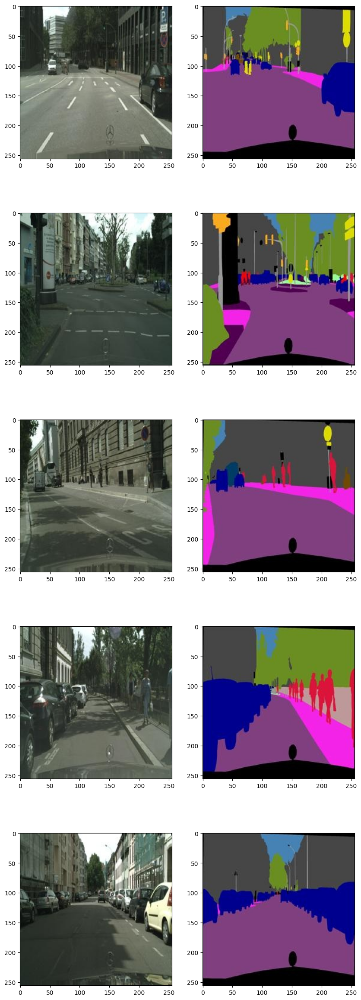

In [3]:
fig, ax = plt.subplots(5, 2, figsize=(10, 30))
for i in range(5):
    img = plt.imread(train_path[i])
    ax[i][0].imshow(img[:,:256])
    ax[i][1].imshow(img[:,256:])

# **Defining Custom Dataset**

In [4]:
train_dataset = []
valid_dataset = []

In [5]:
#torch.utils.data.Dataset/Dataloader
class dataset(Dataset):
    def __init__(self, image_path, transform_img = None, transform_label = None):
        self.image_path = image_path
        self.transform_img = transform_img
        self.transform_label = transform_label
    
    def __len__(self):
        return len(self.image_path)
    
    def __getitem__(self, idx):
        img = plt.imread(self.image_path[idx])
        
        image, label = img[:,:img.shape[1]//2], img[:,img.shape[1]//2:]
        
        if self.transform_img:
            image = self.transform_img(image)
            
        if self.transform_label:
            label = self.transform_label(label)
        
        return image, label

**Defining Transforms / Data Augmentation**

In [6]:
myTransformImage = transform.Compose([
    transform.ToTensor(),
#     transform.RandomHorizontalFlip(p = 0.9)
])

myTransformLabel = transform.Compose([
    transform.ToTensor(),
    
])

In [7]:
train_dataset = dataset(train_path, myTransformImage, myTransformLabel)
valid_dataset = dataset(valid_path, myTransformImage, myTransformLabel)


# Batches

batch_size = 5
train_loader = DataLoader(train_dataset, batch_size, shuffle = True)
valid_loader = DataLoader(valid_dataset, 1, shuffle = True)

# **Visualizing Batch**

In [8]:
#Print batch

def show_batch(whole_batch):
    images, label = whole_batch[0], whole_batch[1]
    images = images.numpy()
    label = label.numpy()
    fig, lab = plt.subplots(5, 2, figsize = (10, 30))

    for i in range(5):
        lab[i][0].imshow(np.transpose(images[i], (1,2,0)))
        lab[i][1].imshow(np.transpose(label[i], (1,2,0)))

/opt/conda/lib/python3.10/site-packages/torchvision/transforms/functional.py:152: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /usr/local/src/pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()


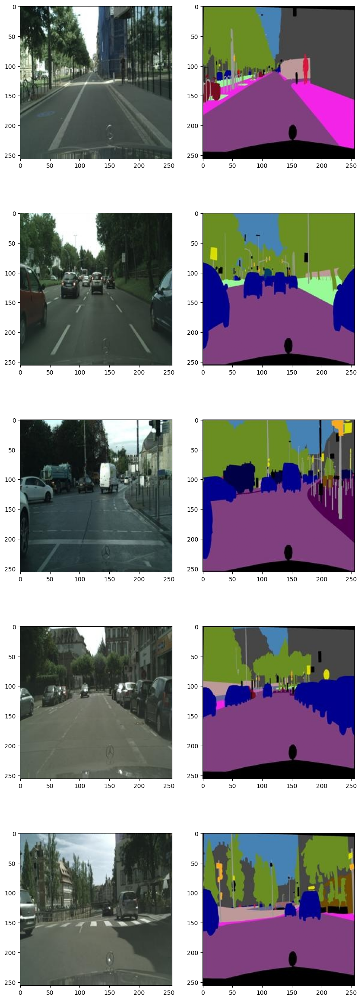

In [9]:
data_iter = iter(train_loader)
show_batch(next(data_iter))


In [10]:
#visualize images, pass the list

def show(pckt):
    
    iters = 1
    if len(pckt[0].shape) > 3:
        iters = pckt[0].shape[0]
        for j in range(iters):
            img = [None]*3
            n = 3
            labels = ['Actual', 'Label', 'Predicted']
            fig, ax = plt.subplots(1, n, figsize=(10, 30))
            for i in range(n):

                x = torch.Tensor.cpu(pckt[j][i])
                x = x.detach().numpy()
                ax[i].imshow(np.transpose(x,(1,2,0)))
                ax[i].set_title(labels[i])
    else:
        img = [None]*3
        n = len(pckt)
        labels = ['Actual', 'Label', 'Predicted']
        fig, ax = plt.subplots(1, n, figsize=(10, 30))
        for i in range(n):
            x = torch.Tensor.cpu(pckt[i])
            x = x.detach().numpy()
            ax[i].imshow(np.transpose(x,(1,2,0)))
            ax[i].set_title(labels[i])
        
    
#     fig, ax = plt.subplots(1, 3, figsize=(10, 30))
    
#     img,out, lab = Img,Lab.detach().permute(1,2,0).numpy(),act
#     print()
#     ax[0].imshow(img.permute(1,2,0))
#     ax[1].imshow(out.permute(1,2,0))
#     ax[2].imshow(label.permute(1,2,0))

torch.Size([3, 256, 256])


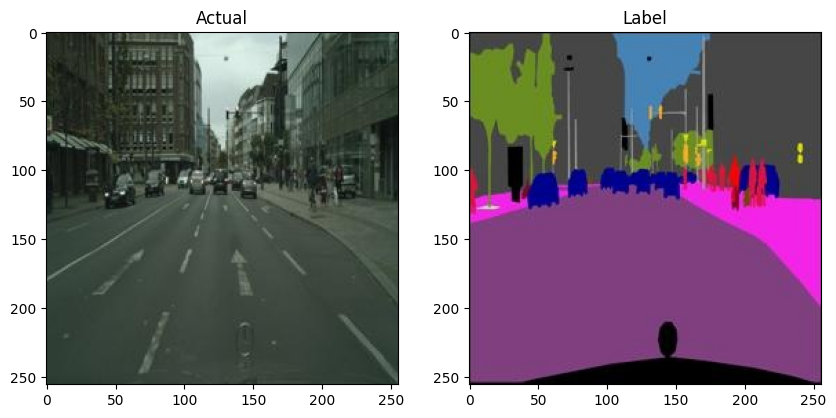

In [11]:
data_iter = iter(train_loader)
img, lab = next(data_iter)

show([img[0], lab[0]])
print(img[0].shape)

In [12]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
device

'cuda'

# **Building UNet model architecture**

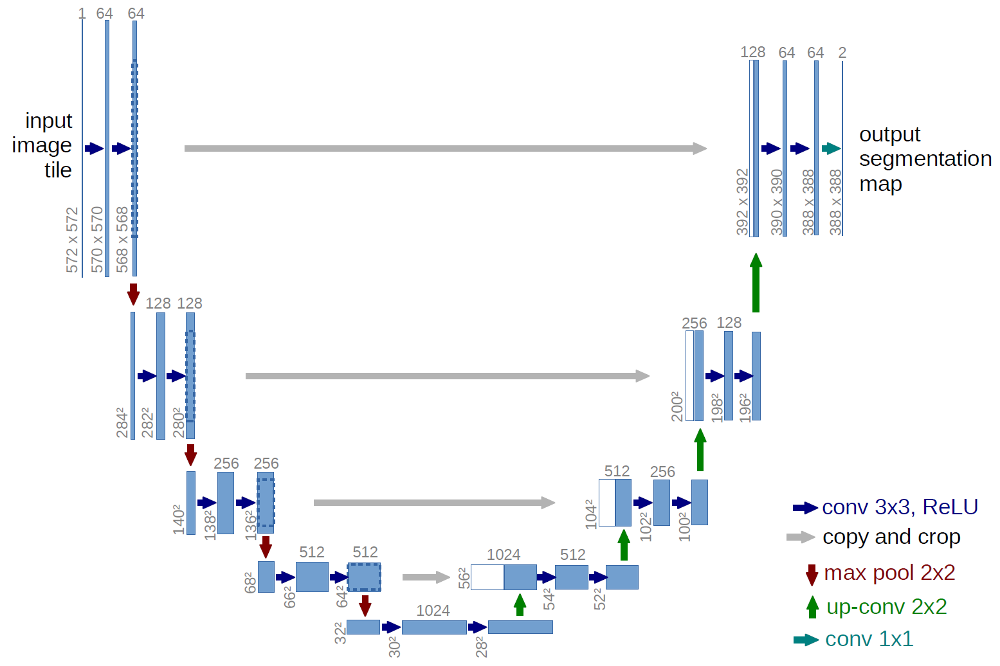

**Original UNet paper didn't had batch normalization in it.**

In [13]:
class conv_block(nn.Module):
    def __init__(self, in_c, out_c):
        super().__init__()
        self.conv1 = nn.Conv2d(in_c, out_c, kernel_size = 3, padding = 1)
        self.bn1 = nn.BatchNorm2d(out_c)
        self.conv2 = nn.Conv2d(out_c, out_c, kernel_size = 3, padding = 1)
        self.bn2 = nn.BatchNorm2d(out_c)
        self.relu = nn.ReLU(inplace = True)
        
    def forward(self, x):
#         print(x.shape)
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.conv2(x)
        x = self.bn2(x)
        x = self.relu(x)
        return x

In [14]:
class encoder_block(nn.Module):
    def __init__(self, in_c, out_c):
        super().__init__()
        self.conv = conv_block(in_c, out_c)
        self.pool = nn.MaxPool2d(2,2)
        
    def forward(self, x):
        x = self.conv(x) #for skip connection feature map to decoder
        p = self.pool(x)
        return x, p

In [15]:
class decoder_block(nn.Module):
    def __init__(self, in_c, out_c):
        super().__init__()
        self.convT =  nn.ConvTranspose2d(in_c, out_c, kernel_size = 2, padding = 0, stride = 2)
        self.conv = conv_block(2*out_c, out_c)
        
    def forward(self, inputs, skips):
        x = self.convT(inputs)
        x = torch.cat([x, skips], axis = 1)
        x = self.conv(x)
        return x

In [16]:
class Unet(nn.Module):
    def __init__(self):
        super().__init__()
        """"Encoder part"""
        
        self.en1 = encoder_block(3, 64)
        self.en2 = encoder_block(64, 128)
        self.en3 = encoder_block(128, 256)
        self.en4 = encoder_block(256, 512)
        
        """Bottleneck"""
        
        self.b = conv_block(512, 1024)
        
        
        """decoder part"""
        
        self.d1 = decoder_block(1024, 512)
        self.d2 = decoder_block(512, 256)
        self.d3 = decoder_block(256, 128)
        self.d4 = decoder_block(128, 64)
        
        
        """Classifier"""
        self.outputs = nn.Conv2d(64, 3, kernel_size=1, padding=0)
        
    def forward(self, input):
#         print(input.shape)
        s1, p1 = self.en1(input)
        s2, p2 = self.en2(p1)
        s3, p3 = self.en3(p2)
        s4, p4 = self.en4(p3)
        
        b = self.b(p4)
        
        d1 = self.d1(b, s4)
        d2 = self.d2(d1, s3)
        d3 = self.d3(d2, s2)
        d4 = self.d4(d3, s1)
        
        out = self.outputs(d4)
        
        return out
        
        

**Initializing model**

In [17]:
model = Unet().float().to(device)

epochs = 30

lr = 0.01

loss_func = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=lr)

In [18]:
train_loss = []
val_loss = []

In [19]:
# !pip install torchview
# import torchview

In [20]:
# model_graph = torchview.draw_graph(model, input_size=(batch_size, 3, 256,256), device='meta')
# model_graph.visual_graph

# **Training**

100%|██████████| 500/500 [00:09<00:00, 54.79it/s]


epoch : 4 ,train loss : 0.03255774351854284 ,valid loss : 0.0259952919408679 


100%|██████████| 500/500 [00:07<00:00, 65.98it/s]


epoch : 4 ,train loss : 0.022989321545455136 ,valid loss : 0.024376115161925553 


100%|██████████| 500/500 [00:07<00:00, 66.65it/s]


epoch : 4 ,train loss : 0.020202752554930058 ,valid loss : 0.02203395171277225 


100%|██████████| 500/500 [00:07<00:00, 67.81it/s]


epoch : 4 ,train loss : 0.018385791847435367 ,valid loss : 0.02181050615757704 


100%|██████████| 500/500 [00:07<00:00, 66.63it/s]


epoch : 4 ,train loss : 0.01675898385461138 ,valid loss : 0.01955323558486998 


100%|██████████| 500/500 [00:07<00:00, 66.47it/s]


epoch : 4 ,train loss : 0.01572270662124668 ,valid loss : 0.018201032501645387 


100%|██████████| 500/500 [00:07<00:00, 68.28it/s]


epoch : 4 ,train loss : 0.015177834221795828 ,valid loss : 0.019469333321787418 


100%|██████████| 500/500 [00:07<00:00, 65.97it/s]


epoch : 4 ,train loss : 0.014575620859610934 ,valid loss : 0.017928200432099403 


100%|██████████| 500/500 [00:07<00:00, 67.90it/s]


epoch : 4 ,train loss : 0.0140220158357768 ,valid loss : 0.01714766060654074 


100%|██████████| 500/500 [00:07<00:00, 68.77it/s]


epoch : 4 ,train loss : 0.013688475082182332 ,valid loss : 0.017322826658375562 


100%|██████████| 500/500 [00:07<00:00, 68.01it/s]


epoch : 4 ,train loss : 0.013246001678072855 ,valid loss : 0.01649031478445977 


100%|██████████| 500/500 [00:07<00:00, 67.63it/s]


epoch : 4 ,train loss : 0.012859695785905885 ,valid loss : 0.016703995323739947 


100%|██████████| 500/500 [00:07<00:00, 67.89it/s]


epoch : 4 ,train loss : 0.012598949321741316 ,valid loss : 0.016915678326971828 


100%|██████████| 500/500 [00:07<00:00, 69.05it/s]


epoch : 4 ,train loss : 0.012249156118941907 ,valid loss : 0.015564196753315628 


100%|██████████| 500/500 [00:07<00:00, 68.51it/s]


epoch : 4 ,train loss : 0.011931651164660183 ,valid loss : 0.015010738499462604 


100%|██████████| 500/500 [00:07<00:00, 69.28it/s]


epoch : 4 ,train loss : 0.011814313036773135 ,valid loss : 0.015476324854418636 


100%|██████████| 500/500 [00:07<00:00, 69.12it/s]


epoch : 4 ,train loss : 0.011421346656602471 ,valid loss : 0.014703388150781394 


100%|██████████| 500/500 [00:07<00:00, 69.28it/s]


epoch : 4 ,train loss : 0.011286782094535708 ,valid loss : 0.015603187344036996 


100%|██████████| 500/500 [00:07<00:00, 68.45it/s]


epoch : 4 ,train loss : 0.010882374515929142 ,valid loss : 0.015039980255998672 


100%|██████████| 500/500 [00:07<00:00, 66.44it/s]


epoch : 4 ,train loss : 0.010811497333670865 ,valid loss : 0.014323560130782426 


100%|██████████| 500/500 [00:07<00:00, 68.34it/s]


epoch : 4 ,train loss : 0.010446899060253836 ,valid loss : 0.015366772880777717 


100%|██████████| 500/500 [00:07<00:00, 69.57it/s]


epoch : 4 ,train loss : 0.010169715419442964 ,valid loss : 0.014747091301716864 


100%|██████████| 500/500 [00:07<00:00, 68.98it/s]


epoch : 4 ,train loss : 0.009885968301570465 ,valid loss : 0.0144963952684775 


100%|██████████| 500/500 [00:07<00:00, 68.34it/s]


epoch : 4 ,train loss : 0.009644474209669759 ,valid loss : 0.014939984266646207 


100%|██████████| 500/500 [00:07<00:00, 66.32it/s]


epoch : 4 ,train loss : 0.009497447147527162 ,valid loss : 0.014396871785633265 


100%|██████████| 500/500 [00:07<00:00, 65.98it/s]


epoch : 4 ,train loss : 0.009220054111748683 ,valid loss : 0.014235433109104634 


100%|██████████| 500/500 [00:07<00:00, 68.12it/s]


epoch : 4 ,train loss : 0.009018119704760925 ,valid loss : 0.014849888304248451 


100%|██████████| 500/500 [00:07<00:00, 69.23it/s]


epoch : 4 ,train loss : 0.00883775610758477 ,valid loss : 0.013912123885471374 


100%|██████████| 500/500 [00:07<00:00, 69.32it/s]


epoch : 4 ,train loss : 0.008498695564745855 ,valid loss : 0.014745475521776826 


100%|██████████| 500/500 [00:07<00:00, 67.91it/s]


epoch : 4 ,train loss : 0.008289762542528264 ,valid loss : 0.014496794982347638 


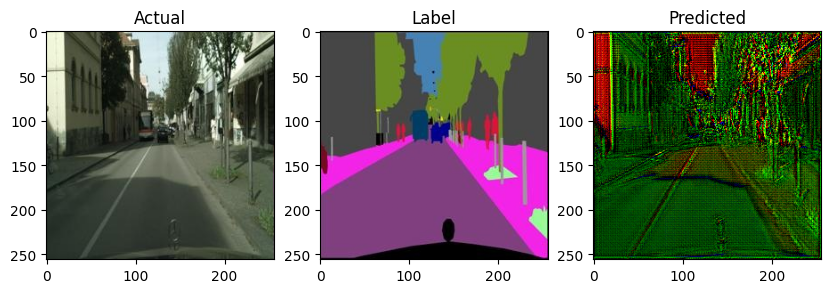

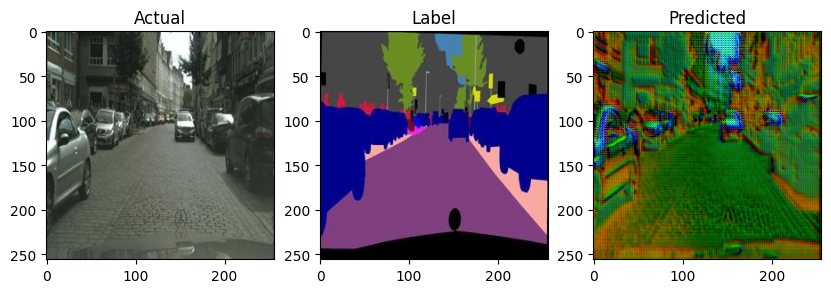

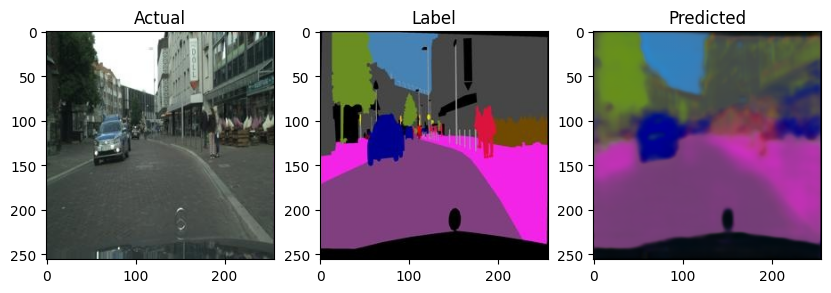

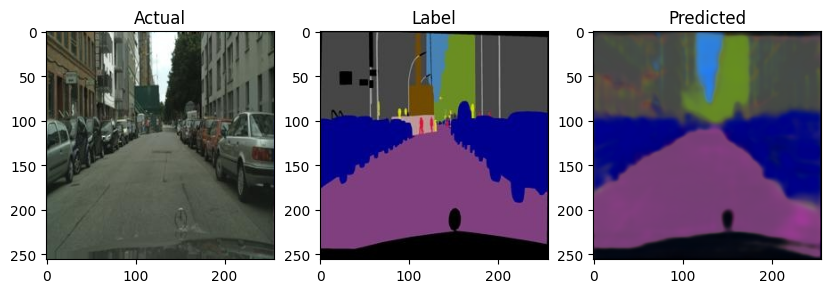

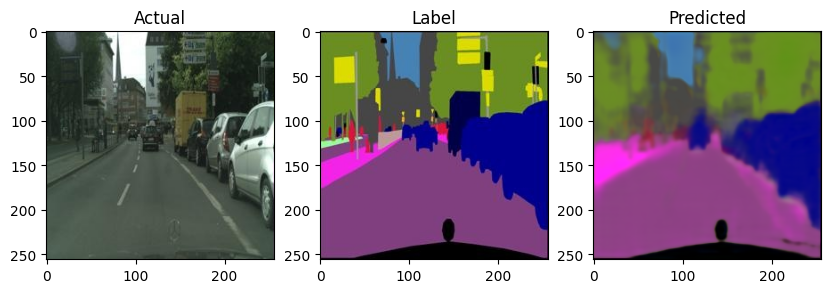

...

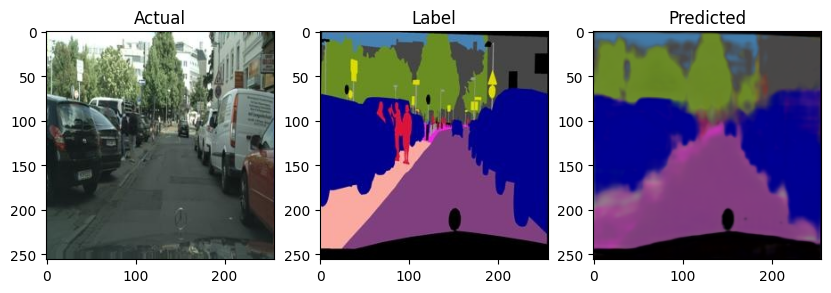

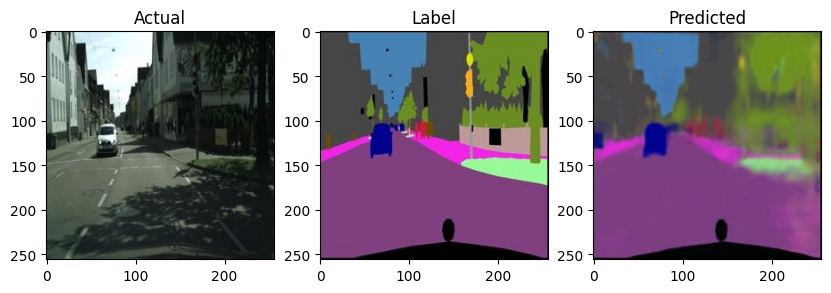

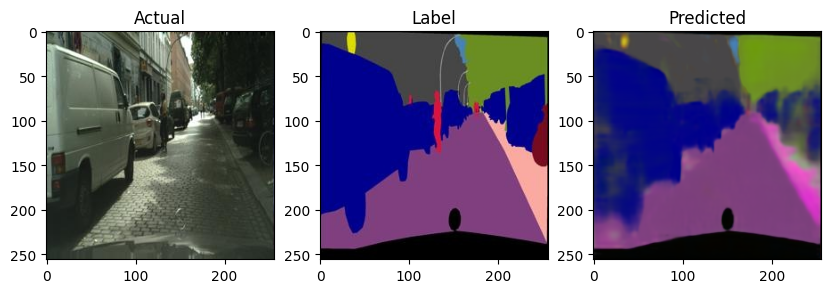

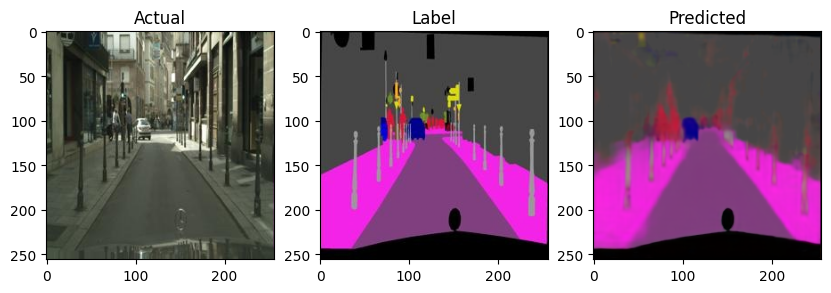

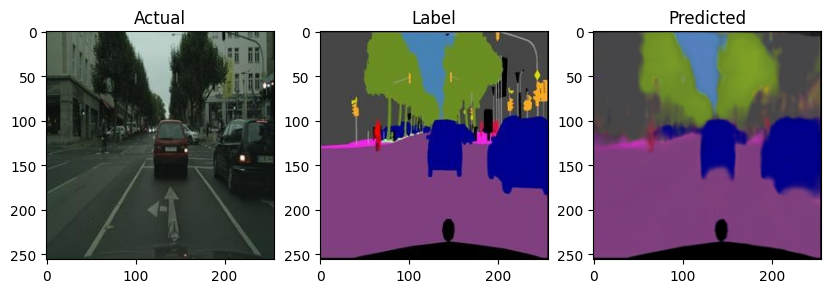

In [21]:
# model.to(device)
for epoch in range(epochs):
    trainloss = 0
    valloss = 0
    c = 0
    for img, lab in tqdm(train_loader):
        optimizer.zero_grad()
        img = img.to(device)
        lab = lab.to(device)
        output = model(img)
        loss = loss_func(output, lab)
        loss.backward()
        optimizer.step()
        trainloss += loss.item()
        
    
        if epoch % 5 == 0 and c < 2:
            show([img[0], lab[0], output[0]])
            c += 1
    train_loss.append(trainloss/len(train_loader))
    
    
    
    for img, lab in tqdm(valid_loader):
        img = img.to(device)
        lab = lab.to(device)
        output = model(img)
        loss = loss_func(output, lab)
        valloss += loss.item()
    val_loss.append(valloss/len(valid_loader))
    
    print("epoch : {} ,train loss : {} ,valid loss : {} ".format(i,train_loss[-1],val_loss[-1]))
        

# **Visualizing Results**

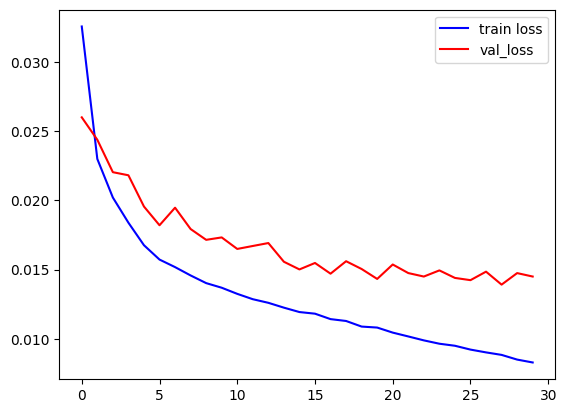

In [22]:
plt.plot(train_loss,color='b',label='train loss')
plt.plot(val_loss,color='r',label = 'val_loss')
plt.legend()

/tmp/ipykernel_23/139395631.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1, n, figsize=(10, 30))


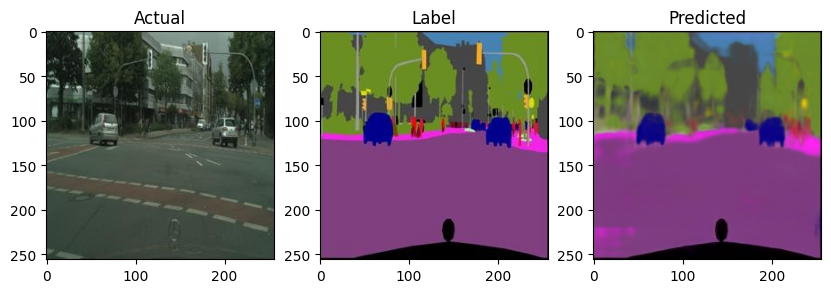

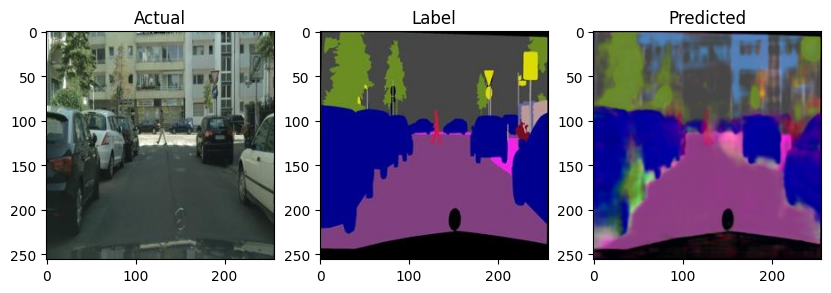

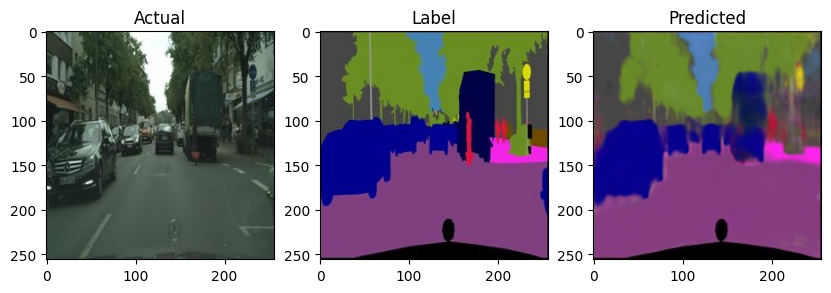

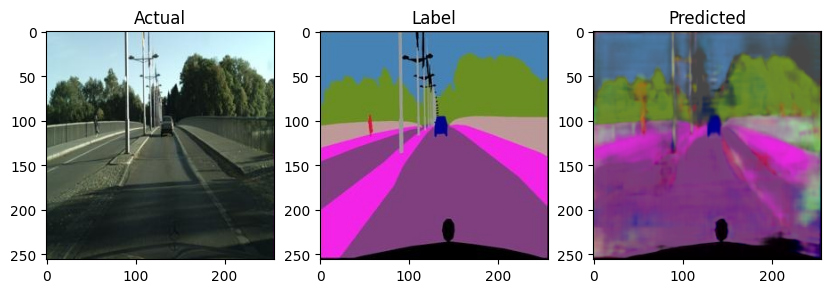

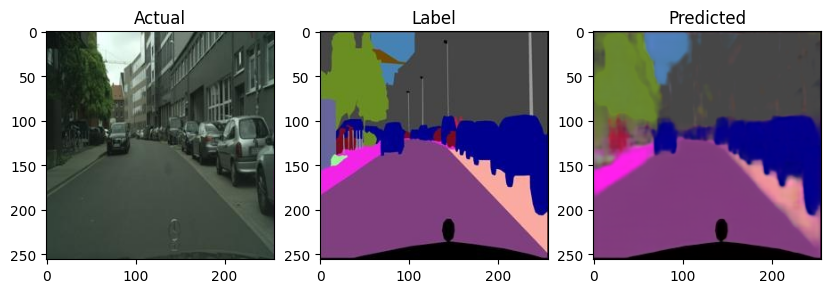

...

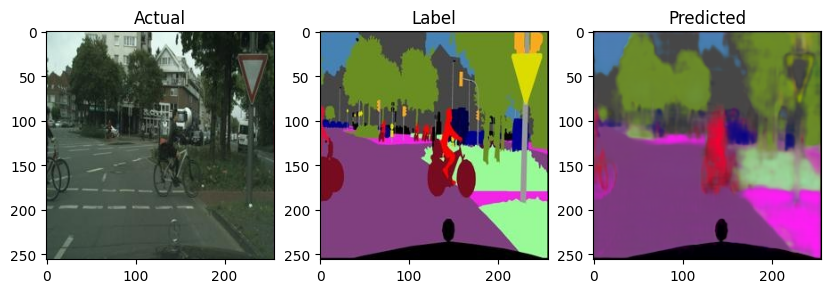

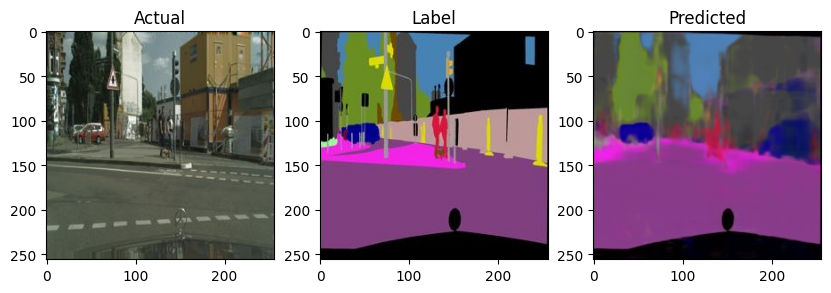

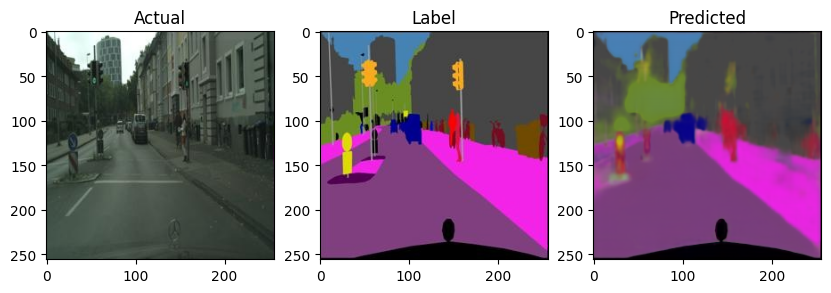

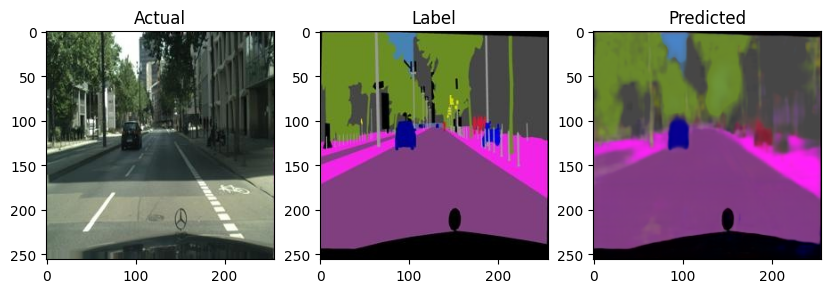

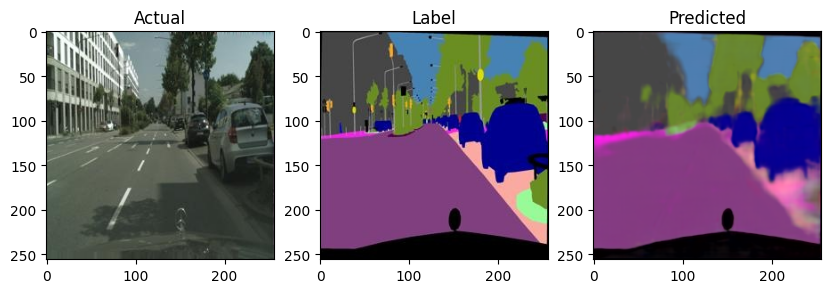

In [23]:
c = 0
for img, lab in valid_loader:
    img = img.to(device)
    label = lab.to(device)
    output = model(img)
    show([img[0],label[0],output[0]])
    if c>20:
        break
    c+=1